## Part 1 [30 marks]

**Task 1: Create and Analyze Basic Matrices**

In [1]:
# TODO: Import necessary libraries (numpy, scipy, matplotlib)

import numpy as np
import scipy as sp
import matplotlib.pyplot as plt


In [2]:
#TODO: Create a 3x3 Toeplitz matrix using scipy
col1 = [1,4,5]
row1= [1,2,3]
matT = sp.linalg.toeplitz(row1,col1)

In [3]:
# TODO: Create a 3x3 Circulant matrix using scipy.linalg.circulant

c = [1,2,3]
matC = sp.linalg.circulant(c)  # column circulant function

In [4]:
# TODO: Compute the determinant of both matrices using numpy.linalg.det

detT = np.linalg.det(matT)
detC = np.linalg.det(matC)

In [5]:
# TODO: Compute the inverse of both matrices using numpy.linalg.inv
invT = np.linalg.inv(matT)
invC = np.linalg.inv(matC)

In [7]:
# TODO: Print the Toeplitz matrix, Circulant matrix, their determinants, and inverses, your results should look like the following 

print(f"Toeplitz Matrix (3x3):\n{matT}")
print(f"Circulant Matrix (3x3):\n{matC}")
print(f"Determinant of Toeplitz Matrix: {detT}")
print(f"Determinant of Circulant Matrix: {detC}")
print("Inverse of Toeplitz Matrix:")
print(invT)
print("Inverse of Circulant Matrix:")
print(invC)

Toeplitz Matrix (3x3):
[[1 4 5]
 [2 1 4]
 [3 2 1]]
Circulant Matrix (3x3):
[[1 3 2]
 [2 1 3]
 [3 2 1]]
Determinant of Toeplitz Matrix: 37.99999999999999
Determinant of Circulant Matrix: 17.999999999999996
Inverse of Toeplitz Matrix:
[[-0.18421053  0.15789474  0.28947368]
 [ 0.26315789 -0.36842105  0.15789474]
 [ 0.02631579  0.26315789 -0.18421053]]
Inverse of Circulant Matrix:
[[-0.27777778  0.05555556  0.38888889]
 [ 0.38888889 -0.27777778  0.05555556]
 [ 0.05555556  0.38888889 -0.27777778]]


## Part 2 [50 marks]

**Tasks : Generate and Solve Linear Systems**

In [8]:
    # 1. A 3000x3000 Toeplitz matrix using scipy.linalg.toeplitz

col1 = np.arange(1,3001)         #np.arange: gives an array from 1 to 3000
row1= np.arange(1,3001)
matT = sp.linalg.toeplitz(row1,col1)
#matT.shape # (3000,3000)

In [9]:
     # 2. A 3000x3000 Circulant matrix using scipy.linalg.circulant
c = np.arange(1,3001)                    
matC = sp.linalg.circulant(c)
#matC.shape # (3000,3000)

In [10]:
# TODO: Create corresponding random vectors b for each system
bT = np.random.rand(3000)   # generates numbers in range[0,1)
print(bT)

bC = np.random.rand(3000)
print(bC)

[0.57407165 0.41265152 0.83723104 ... 0.09696068 0.4916206  0.4930367 ]
[0.23611664 0.62393505 0.5033241  ... 0.97805616 0.97726531 0.80287748]


In [11]:
# TODO: Solve each system Ax = b using numpy's general-purpose solver

np.linalg.solve(matT,bT)    # solve toeplitz
np.linalg.solve(matC,bC)    # solve circulant


array([ 1.89030347e-04, -1.29162739e-04,  4.03137150e-05, ...,
       -2.96379525e-05,  3.73684351e-07,  5.82393400e-05])

In [12]:
# TODO: Solve above toeplitz system using scipy's specialized solvers

# pass the toeplitz matrix and the b vector as parameters
sp.linalg.solve_toeplitz((col1,row1), bT)


array([-0.08053227,  0.29299982, -0.52190318, ...,  0.41552477,
       -0.19662191, -0.00053026])

In [13]:
# TODO: Solve above circulant system using scipy's specialized solvers

# pass the circulant matrix and the b vector as parameters
sp.linalg.solve_circulant(c, bC)

array([ 1.89030347e-04, -1.29162739e-04,  4.03137150e-05, ...,
       -2.96379525e-05,  3.73684351e-07,  5.82393400e-05])

In [14]:
# Task 2: Compare execution times (import time library here) toeplitz system using scipy's specialized solvers Vs Numpy solution for same system, make sure your results look like in following formate
import time

st = time.time()
np.linalg.solve(matT,bT)
endN_T = time.time()-st

print(f"Execution Time for NumPy general solve() function for Toeplitz system: {endN_T}")

st = time.time()
sp.linalg.solve_toeplitz((col1,row1), bT)
endS_T = time.time()-st

print(f"Execution Time for SciPy (Toeplitz): {endS_T}")



Execution Time for NumPy general solve() function for Toeplitz system: 1.099928855895996
Execution Time for SciPy (Toeplitz): 0.029917240142822266


<BarContainer object of 2 artists>

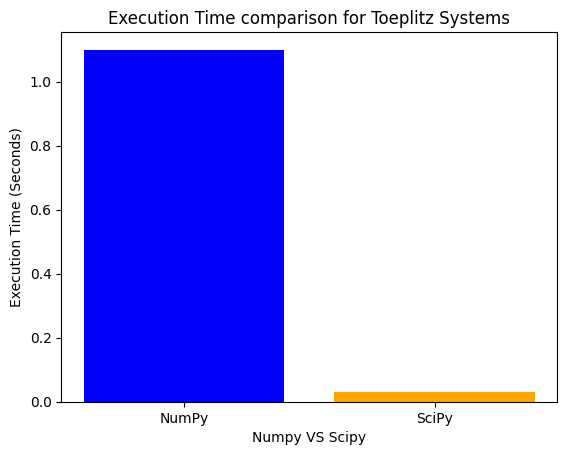

In [15]:

# Task 2: plot the Comparison using plt.plot Execution Times toeplitz system using scipy's specialized solvers Vs Numpy solution for same system

x = np.linspace(0.0, 1.2, 7)
plt.title("Execution Time comparison for Toeplitz Systems")
x_title = ["NumPy", "SciPy"]
execution_times = [endN_T, endS_T]
plt.ylabel("Execution Time (Seconds)")
plt.xlabel("Numpy VS Scipy")
plt.bar(x_title, execution_times, color=['blue', 'orange'])

In [16]:
# TODO: Compare Execution Times circulant system using scipy's specialized solvers Vs Numpy solution for same system

st = time.time()
np.linalg.solve(matC,bC)
endN_C = time.time()-st

print(f"Execution Time for NumPy.solve()  Circulant system: {endN_C}")

st = time.time()
sp.linalg.solve_circulant(c, bC)
endS_C = time.time()-st

print(f"Execution Time for SciPy special function for Circulant system: {endS_C}")

Execution Time for NumPy.solve()  Circulant system: 2.1625208854675293
Execution Time for SciPy special function for Circulant system: 0.0016298294067382812


<BarContainer object of 2 artists>

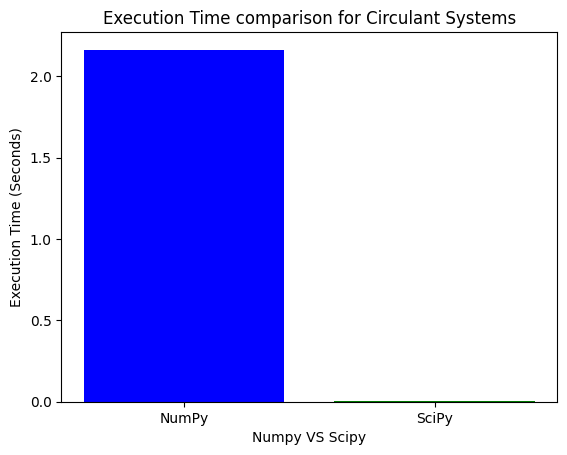

In [17]:
# TODO: plot the Comparison using plt.plot Execution Times circulant system using scipy's specialized solvers Vs Numpy solution for same system

x = np.linspace(0.0, 1.2, 5)
plt.title("Execution Time comparison for Circulant Systems")
x_title = ["NumPy", "SciPy"]
execution_times = [endN_C, endS_C]
plt.ylabel("Execution Time (Seconds)")
plt.xlabel("Numpy VS Scipy")
plt.bar(x_title, execution_times, color=['blue', 'green'])

## Part 3: [50 marks]

***Task 1: Implement a function mm() to perform Naive matrix multiplication***

In [19]:

def mm(mat1,mat2):
  
    (n, m) = np.shape(mat1)
    (m, p) = np.shape(mat2)
    mat3 = np.zeros((n, p))

    rows_mat1 = len(mat1)
    cols_mat1 = len(mat1[0])    # if matrix are not the same size, mat[0] is used to get the column size
    rows_mat2 = len(mat2)

    for i in range(rows_mat1):
        for j in range(cols_mat1):
            for k in range(rows_mat2):
                mat3[i][j] += mat1[i][k] * mat2[k][j]

    for row in mat3:
        print("\t".join(map(str, row)))            

***Task 2: Implement a function mm_vec() to perform Vectorized matrix multiplication***

In [20]:
def mm_vec(mat1,mat2):

    # np arrays are needed for .inner ftn so lists are converted to arrays
    mat1 = np.array(mat1)
    mat2 = np.array(mat2)

    (n, m) = np.shape(mat1)
    (m, p) = np.shape(mat2)
    mat3 = np.zeros((n, p))

    rows_mat1 = len(mat1)
    cols_mat1 = len(mat1[0])    # if matrix are not the same size
    rows_mat2 = len(mat2)

    for i in range(rows_mat1):
        for j in range(cols_mat1):
            mat3[i,j] = np.inner(mat1[i,:],mat2[:,j])   

    for row in mat3:
        print("\t".join(map(str, row)))        
    


***Task 3: Implenent a function mm_np() that uses numpy to perform matrix multiplication***

In [21]:
def mm_np(A,B):
     result =  np.matmul(A,B)

     for row in result:
          print("\t".join(map(str, row))) 


***Task 4: Ensure that mm() and mm_vec() functions perform correct matrix multiplication***

In [23]:
#mat1 = [[1,2],[3,4]]
#mat2 = [[5,6],[7,8]]
#mat3 = [[0,0],[0,0]]
mat1 = [[12,22,23],[4,5,6],[7,8,9]]
mat2 = [[9,8,7],[6,5,4],[3,2,1]]

print("Naive mathod:\n")
mm(mat1,mat2)
print("\nVectorized method:\n")
mm_vec(mat1,mat2)

Naive mathod:

309.0	252.0	195.0
84.0	69.0	54.0
138.0	114.0	90.0

Vectorized method:

309.0	252.0	195.0
84.0	69.0	54.0
138.0	114.0	90.0


***Task 5: Visualize Performance and Results***

In [26]:
# TODO: Plot the execution time comparisons of the three functions that you implemented for matrix of size 5x5

import time
a = np.random.rand(5,5)
b = np.random.rand(5,5)


t0=time.time()
print("\nNaive method:\n")
C=mm(a,b)
t1=time.time()
time1 = t1-t0

t3=time.time()
print("\nVectorized method:\n")
C=mm_vec(a,b)
t4=time.time()
time2 = t4-t3

t5=time.time()
print("\nNumPy method:\n")
C=mm_np(a,b)
t6=time.time()
time3 = t6-t5

print(f'\nThe time taken by naive method {time1}')
print(f'The time taken by vectorized method {time2}')
print(f'The time taken by NumPy multiplication {time3}')



Naive method:

0.9344169910386028	0.6282203582606349	0.6537291529314089	0.9451177416459411	0.8136228929534775
1.212537896167313	1.0023897408855198	1.058538995779412	1.3595354763388972	1.0807318153457455
1.5944664135576234	1.2406634502730336	0.9642591267057844	1.6515652456315788	0.7438680171515277
1.362499384552908	1.0558401739762915	0.7682196329500754	1.4218264646484355	1.2877588105498134
1.0728994570285035	0.8753035403538788	0.7323793643025608	1.201552173150835	0.9735928517394534

Vectorized method:

0.9344169910386028	0.6282203582606349	0.6537291529314089	0.945117741645941	0.8136228929534775
1.212537896167313	1.00238974088552	1.058538995779412	1.359535476338897	1.0807318153457453
1.5944664135576234	1.2406634502730336	0.9642591267057845	1.6515652456315788	0.7438680171515277
1.3624993845529079	1.0558401739762915	0.7682196329500753	1.4218264646484355	1.2877588105498134
1.0728994570285035	0.8753035403538788	0.7323793643025607	1.2015521731508352	0.9735928517394534

NumPy method:

0.93441


Naive method:

128.3757082012235	123.11755759012841	131.15770897962634	131.33849798747636	128.8783719896	124.71412822750882	124.68666362273142	126.15409764832648	128.710897686737	123.46335493307556	127.50715736473116	124.72667904414449	121.5560799575104	124.59290353525105	121.91923232502913	124.11506033935517	126.79047709682796	126.4146059616966	121.18232964912531	131.01722822106464	123.59181969775975	127.48213599573613	125.66434985157007	129.79675404612948	129.07306105058692	126.4405400030294	126.75813197510513	121.29166766340892	125.48330318010758	121.31810473730498	120.10555465704331	120.25927684422851	132.1410268212863	126.59371760810872	126.08712927829406	129.00147889776133	127.93190575931226	129.77864650213195	117.12349470142242	126.31332243109519	121.68283969959828	127.28059048227485	128.6066163770515	121.69360180584668	121.5915188511198	123.22123501724401	127.36132532563038	125.32203043864597	124.08241079768963	127.78943418489087	124.2418063593388	124.9395216120192	126.3955899

<BarContainer object of 3 artists>

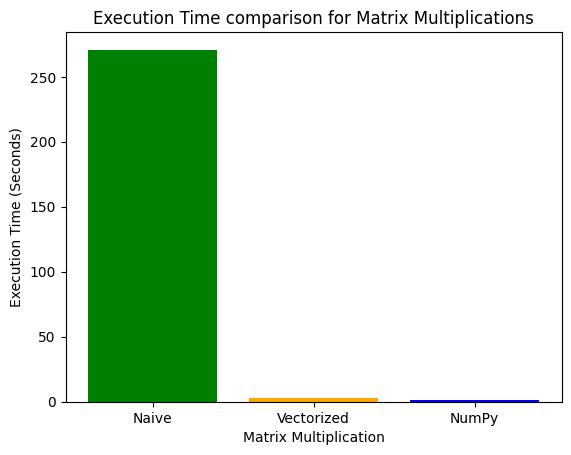

In [27]:
# TODO: Plot the execution time comparisons of the three functions that you implemented for matrix of size 500x500
import time
a = np.random.rand(500,500)
b = np.random.rand(500,500)

t0=time.time()
print("\nNaive method:\n")
C=mm(a,b)
t1=time.time()
time1 = t1-t0

t3=time.time()
print("\nVectorized method:\n")
C=mm_vec(a,b)
t4=time.time()
time2 = t4-t3

t5=time.time()
print("\nNumPy method:\n")
C=mm_np(a,b)
t6=time.time()
time3 = t6-t5

print(f'\nThe time taken by naive method {time1}')
print(f'The time taken by vectorized method {time2}')
print(f'The time taken by NumPy multiplication {time3}')

x = np.linspace(0.0, 1.2, 7)
plt.title("Execution Time comparison for Matrix Multiplications")
x_title = ["Naive", "Vectorized", "NumPy"]
execution_times = [time1, time2, time3]
plt.ylabel("Execution Time (Seconds)")
plt.xlabel("Matrix Multiplication")
plt.bar(x_title, execution_times, color=['green', 'orange', 'blue'])


#### Conclusion

# TODO: Analyze the results and write a brief report in the markdown cell, discussing these performance results


COMPARISON NAIVE METHOD VS VEXTORIZED MULTIPLICATION VS NUMPY MULTIPLICATION:

The performance comparison reveals that the naive matrix multiplication method is significantly slower, taking approximately 270.83 seconds, due to its inefficient use of nested loops. The vectorized method improves performance markedly, reducing the computation time to about 2.85 seconds by leveraging more efficient operations. However, the NumPy multiplication method outperforms both, executing in just 1.07 seconds.


